In [1]:
!pip install dython imbalanced-learn

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML, IFrame
from dython import nominal
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.compose import ColumnTransformer
from imblearn.over_sampling import SMOTE
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from scipy import stats



import helpers

random_state=0
image_size=(30,30)

In [3]:
df = pd.read_feather('cleaned_dataset.feather')

In [4]:
df.shape

(230693, 60)

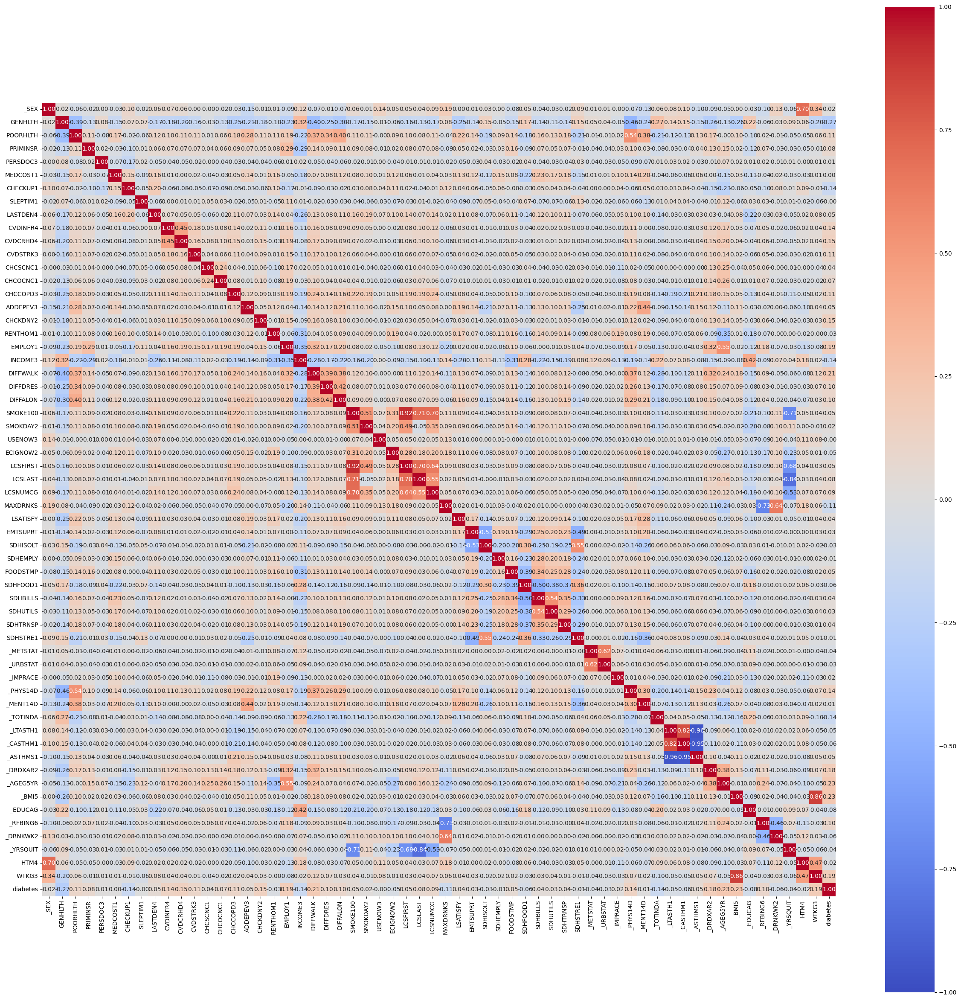

In [5]:
intial_correlations = nominal.associations(df, nominal_columns='auto', plot=True, figsize=image_size, cmap='coolwarm')

## Smoking Factor Feature Engineering

The decision to engineer a composite smoking factor was based on several considerations:

1. Multiple correlated variables: The dataset contains several smoking-related variables (SMOKDAY2, SMOKE100, LCSFIRST, LCSNUMCG, LCSLAST, USENOW3, _YRSQUIT) that are highly correlated. Using all these variables individually could lead to multicollinearity issues in our models.

2. Capturing cumulative impact: Research shows that the health impact of smoking is influenced by multiple factors, including intensity (number of cigarettes), duration, age of onset, and time since quitting. A composite score can better capture this cumulative effect. (https://archive.cdc.gov/#/details?url=https://www.cdc.gov/tobacco/sgr/50th-anniversary/index.htm, https://www.cdc.gov/mmwr/volumes/71/ss/ss7105a1.htm?s_cid=ss7105a1_w) 

3. Simplification: By combining multiple smoking-related variables into a single factor, we simplify our feature space while retaining important information.

This formula incorporates:
- Pack-years (intensity and duration)
- Age of onset (earlier onset is associated with higher risk)
- Time since quitting (risk decreases over time after quitting)

The resulting 'smoking_factor' provides a more nuanced representation of smoking behavior and its potential health impact than any single smoking-related variable.

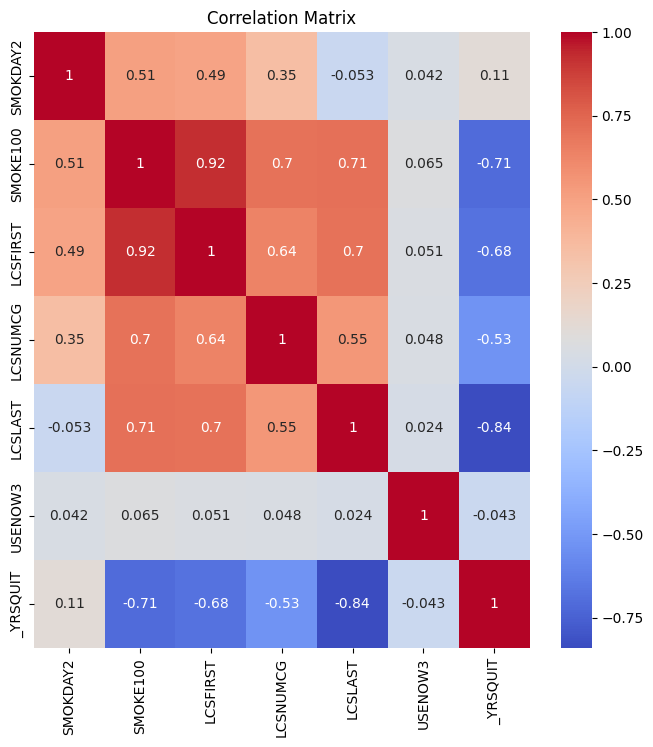

In [6]:
smoking_columns = ['SMOKDAY2', 'SMOKE100', 'LCSFIRST', 'LCSNUMCG', 'LCSLAST', 'USENOW3', '_YRSQUIT']
helpers.plot_columnar_correlation(df, columns=smoking_columns, figsize=(8,8))

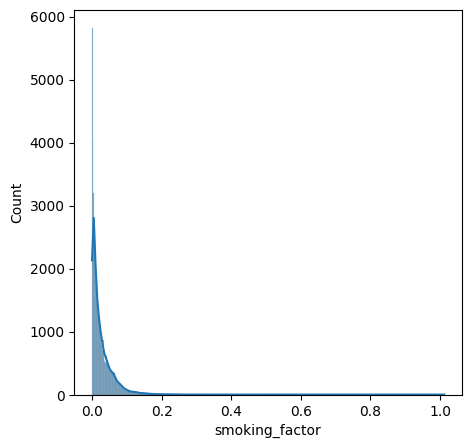

In [7]:
df['_quit_factor'] = np.where((df['SMOKE100'] == 0) | (df['_YRSQUIT'] == 99), 0, 1 - (1 / (0.5 + np.log1p(df['_YRSQUIT']))))
df['_onset_factor'] = np.where((df['SMOKE100'] == 0) | (df['_YRSQUIT'] == 99), 0, (df['LCSFIRST']) / 99)
df['_years_smoked'] = np.where((df['SMOKE100'] == 0) | ~(df['LCSLAST'] > df['LCSFIRST']), 0, (df['LCSLAST'] - df['LCSFIRST']) / 99)
df['_packyears'] = np.where((df['SMOKE100'] == 0) | (df['_YRSQUIT'] == 99), 0, (df['_years_smoked']) * (df['LCSNUMCG']) / 14)
df['smoking_factor'] = (
    df['_packyears']
    * df['_onset_factor']
    * df['_quit_factor']
)

plt.figure(figsize=(5,5))
sns.histplot(df[(df['SMOKE100'] != 0) & (df['_YRSQUIT'] != 99)]['smoking_factor'], kde=True)
plt.show()

df = df.drop(smoking_columns + ['_quit_factor', '_onset_factor', '_years_smoked', '_packyears'], axis=1)

## Emotional and financial stability are correlated

This suggests that the more financially stable somebody is, the more likely they are to report having emotional stability as well. Consequently, I'm going to engineer a feature that tries to capture "stability" as a single variable. and drop the emotional stability columns

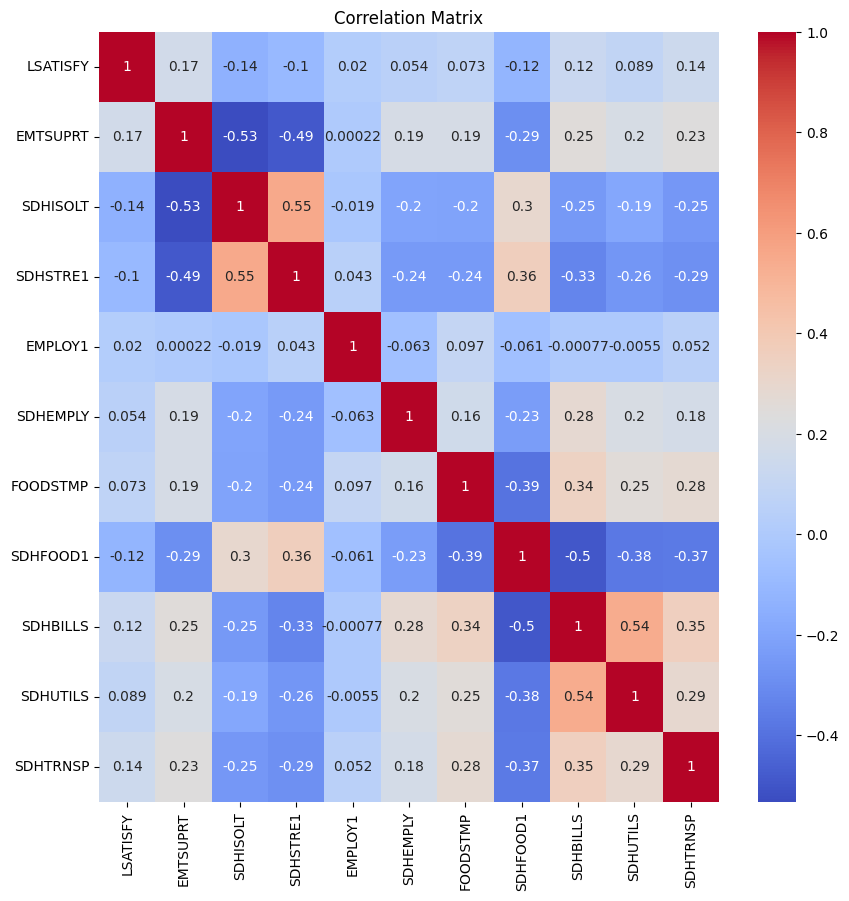

In [8]:
emotional_features = ['LSATISFY', 'EMTSUPRT', 'SDHISOLT', 'SDHSTRE1']
financial_features = ['EMPLOY1', 'SDHEMPLY', 'FOODSTMP', 'SDHFOOD1', 'SDHBILLS', 'SDHUTILS', 'SDHTRNSP']
helpers.plot_columnar_correlation(df, emotional_features + financial_features, (10,10))

In [9]:
# Ensure SDHFOOD1 is on a 0-1 scale where 1 is more stable
df['SDHFOOD1'] = 1 - df['SDHFOOD1'] / df['SDHFOOD1'].max()

# Creates a weight where employment is larger, and unemployment is smaller. with longer-duration unemployment being smaller than short-term unemployment. retirement/homemaker/etc are in the middle. unable to work is the lowest value.
employ_score = {1: 1, 2: 0.9, 3: 0.2, 4: 0.4, 5: 0.6, 6: 0.7, 7: 0.8, 8: 0.1}
df['employ_score'] = df['EMPLOY1'].map(employ_score)

# Income scoring (normalize to 0-1 range)
df['income_score'] = (df['INCOME3'] - 1) / 10 

financial_features.extend(['income_score', 'employ_score'])

# Calculate financial stability score. Emotional stability will be dropped as it is too correlated
df['financial_stability_score'] = df[financial_features ].mean(axis=1)
df = df.drop(financial_features + emotional_features + ['INCOME3', 'EMPLOY1'] + ['employ_score', 'income_score'], axis=1)

# Difficulties are strongly correlated

DIFFALON, DIFFDRES, and DIFFWALK can all represent the same underlying issues, and have a strong correlation in the data. We'll engineer a feature that combines them

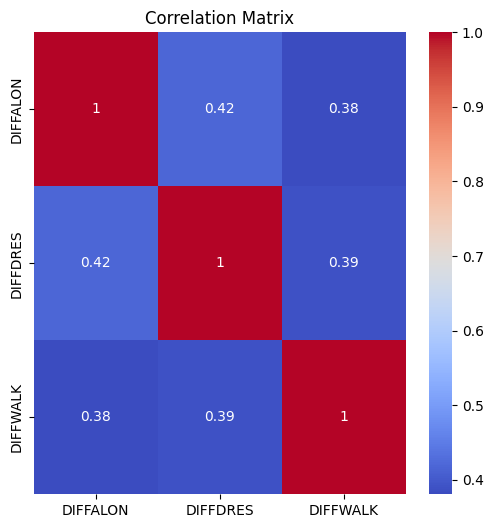

In [10]:
helpers.plot_columnar_correlation(df, ['DIFFALON', 'DIFFDRES', 'DIFFWALK'], (6, 6))

In [11]:
df['health_difficulties'] = df['DIFFALON'] | df['DIFFDRES'] | df['DIFFWALK']
df = df.drop(['DIFFALON', 'DIFFDRES', 'DIFFWALK'], axis=1)

### Booleans

I'm not actually converting these to boolean features as leaving them as integers makes further analysis easier.

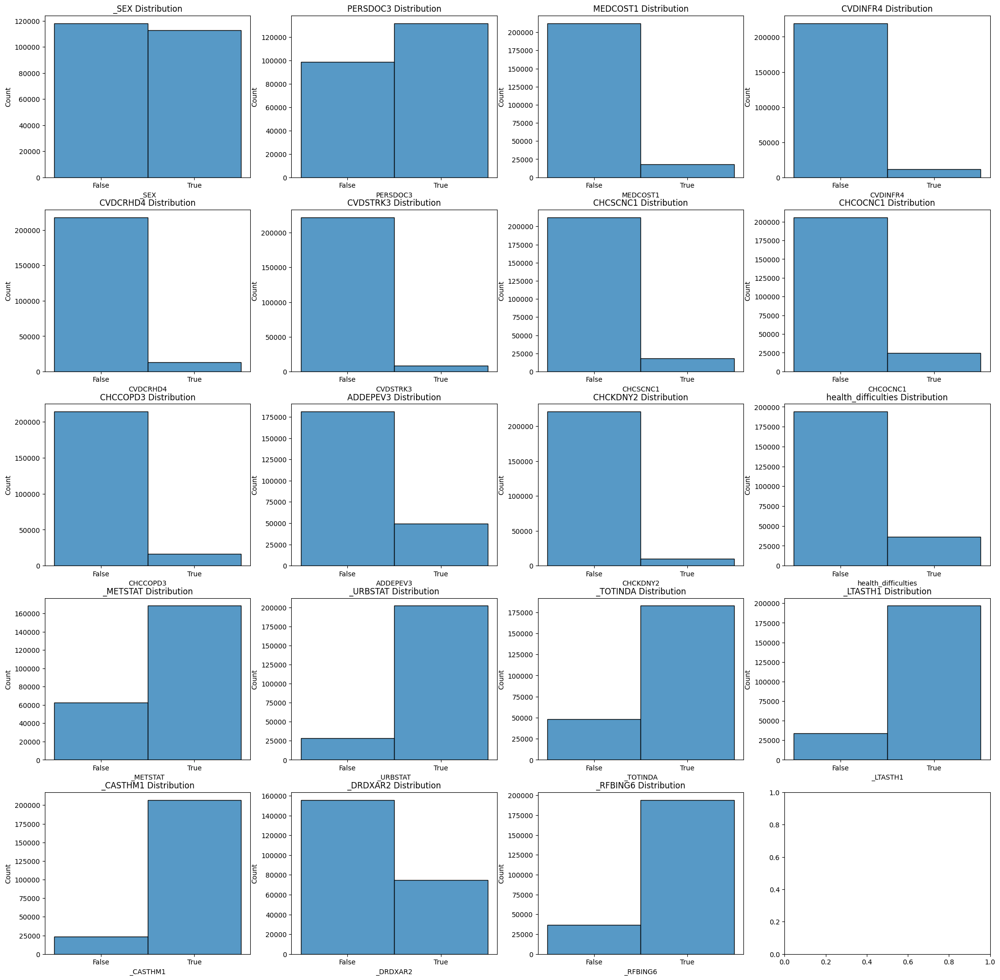

In [12]:
boolean_columns = {
    '_SEX': 'Int64',       # Calculated sex variable (1=Male, 2=Female)
    'PERSDOC3': 'Int64',   # Have personal doctor? (1=Yes, 2=No, 7, 9)
    'MEDCOST1': 'Int64',   # Unable to get medical care due to cost (1=Yes, 2=No, 7, 9)
    'CVDINFR4': 'Int64',   # Ever told had heart attack (1=Yes, 2=No, 7, 9)
    'CVDCRHD4': 'Int64',   # Ever told had angina (1=Yes, 2=No, 7, 9)
    'CVDSTRK3': 'Int64',   # Ever told had stroke (1=Yes, 2=No, 7, 9)
    'CHCSCNC1': 'Int64',   # Ever told had skin cancer (1=Yes, 2=No, 7, 9)
    'CHCOCNC1': 'Int64',   # Ever told had any other type of cancer (1=Yes, 2=No, 7, 9)
    'CHCCOPD3': 'Int64',   # Ever told had COPD (1=Yes, 2=No, 7, 9)
    'ADDEPEV3': 'Int64',   # Ever told had depressive disorder (1=Yes, 2=No, 7, 9)
    'CHCKDNY2': 'Int64',   # Ever told had kidney disease (1=Yes, 2=No, 7, 9)
    'health_difficulties': 'Int64',   # Difficulty walking or climbing stairs, dressing, bathing, or doing errands (1=Yes, 2=No)
    '_METSTAT': 'Int64',   # Metropolitan status (1=Yes, 2=No)
    '_URBSTAT': 'Int64',   # Urban status (1=Yes, 2=No)
    '_TOTINDA': 'Int64',   # Leisure time physical activity (1=Active, 2=Inactive)
    '_LTASTH1': 'Int64',   # Computed lifetime asthma (1=Yes, 2=No)
    '_CASTHM1': 'Int64',   # Computed current asthma (1=Yes, 2=No)
    '_DRDXAR2': 'Int64',   # Computed arthritis (1=Yes, 2=No)
    '_RFBING6': 'Int64',   # Binge drinking (1=Yes, 2=No)
}

fig, axes = helpers.grid_display(4, len(boolean_columns))
for idx, c in enumerate(boolean_columns):
    #df[c] = df[c].astype(bool)
    sns.histplot(data=df[c], ax=axes[idx], discrete=True)
    axes[idx].set_xticks([0, 1], ['False', 'True'])
    axes[idx].set_title(f'{c} Distribution')

### At a glance:

   - Balanced Distribution:
       - SEX: Nearly even split, suggesting a balanced gender representation in the dataset.
   - Highly Imbalanced Distributions (vast majority in one category):
       - PERSDOC3, MEDCOST1, CVDINFR4, CVDCRHD4, CVDSTRK3, CHCSCNC1, CHCOCNC1, CHCOPD3, DIFFWALK, DIFFORES, DIFFALON, URBSTAT: 
        These show a strong imbalance towards 0, indicating rare conditions or characteristics in the population.
   - Moderately Imbalanced:
       - ADDEPEV3, CHCKDNY2, METSTAT: Show a significant imbalance, but less extreme than the previous group.
   - Reverse Imbalance:
       - TOTINDA, CASTHM1: These show a majority in the '1' category, opposite to most other variables.
   - Unique Distributions:
       - RFBING5: Shows a more balanced distribution compared to most others, with a slight majority in the '1' category.

      
### Interpretations:

   - Health Conditions: Variables like CVDINFR4, CVDCRHD4, CVDSTRK3, CHCSCNC1, CHCOCNC1, CHCOPD3 represent specific health conditions. Their low occurrence (high count of 0s) suggests these are relatively rare in the population.
   - Access to Healthcare: PERSDOC3 and MEDCOST1 refer to having a personal doctor and medical cost concerns. The imbalance suggests most people have access to healthcare or don't face significant cost barriers.
   - Physical Abilities: DIFFWALK, DIFFORES, DIFFALON relate to difficulties in mobility or daily activities. The imbalance indicates these difficulties are not common in the sample.
   - Lifestyle Factors: TOTINDA and RFBING5 represent lifestyle choices (exercise/bing-drinking). The more balanced nature of these suggests they're more common occurrences.
   - Geographic Factor: URBSTAT urban vs. rural, with a clear majority in urban. However this mirrors METSTAT, and METSTAT both has better balance, and likely tells us more about access to medical facilities than URBSTAT.

### Implications for Analysis:

   - Class Imbalance: For most variables, any predictive modeling will need to account for severe class imbalance.
   - Feature Importance: Highly imbalanced features might have limited predictive power in some models.
   - Rare Event Analysis: For health conditions, we're dealing with rare event prediction, which requires specific analytical approaches.
   - Sampling Considerations: May need to consider oversampling the minority class or using techniques like SMOTE.


## URBSTAT/METSTAT correlation

We'll drop URBSTAT, as METSTAT is a better predictor of access to healthcare

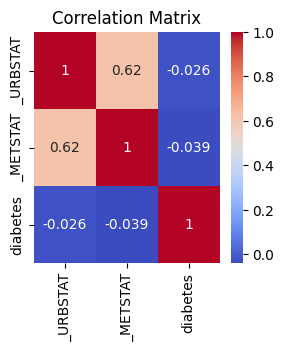

In [13]:
helpers.plot_columnar_correlation(df, ['_URBSTAT', '_METSTAT', 'diabetes'], (3,3))

In [14]:
df = df.drop(['_URBSTAT'], axis=1)

## Asthma variables are strongly correlated

Well keep _CASTHM1, as it is slightly more correlated with diabetes risk in the data

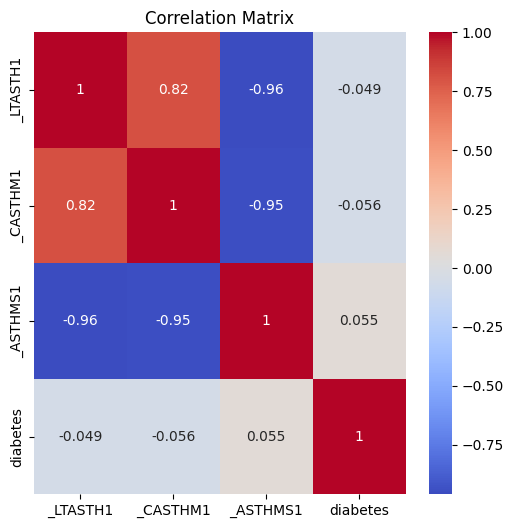

In [15]:
helpers.plot_columnar_correlation(df, ['_LTASTH1', '_CASTHM1', '_ASTHMS1', 'diabetes'], (6,6))

In [16]:
df = df.drop(['_LTASTH1', '_ASTHMS1'], axis=1)

## Drinking indicator correlations

Max drinks binge drinking, and number of drinks are all correlated

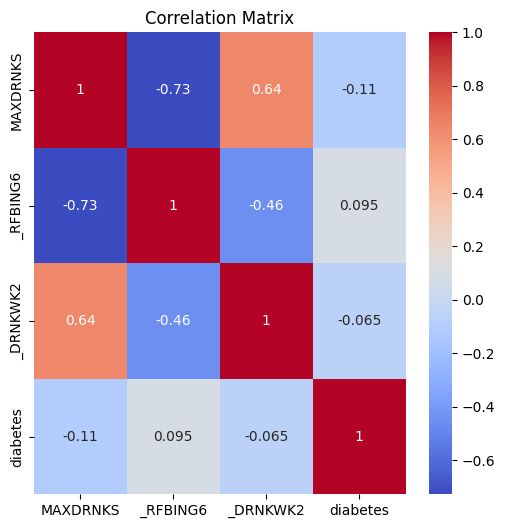

In [17]:
helpers.plot_columnar_correlation(df, ['MAXDRNKS', '_RFBING6', '_DRNKWK2', 'diabetes'], (6,6))

In [18]:
df['drinking'] = df['MAXDRNKS'] + df['_RFBING6']
df = df.drop(['MAXDRNKS', '_RFBING6', '_DRNKWK2'], axis=1)

## BMI and height/weight

These are obviously very correlated, as BMI is product of the others. We'll drop the raw hight/weight as the BMI is better

In [19]:
df = df.drop(['HTM4', 'WTKG3'], axis=1)

## Chronic disease correlations

CVDINFR4, CVDCRHD4, CVDSTRK4, CHCKDNY2, and CHCCOPD3 are correlated. However, all are reasonably predictive of diabetes

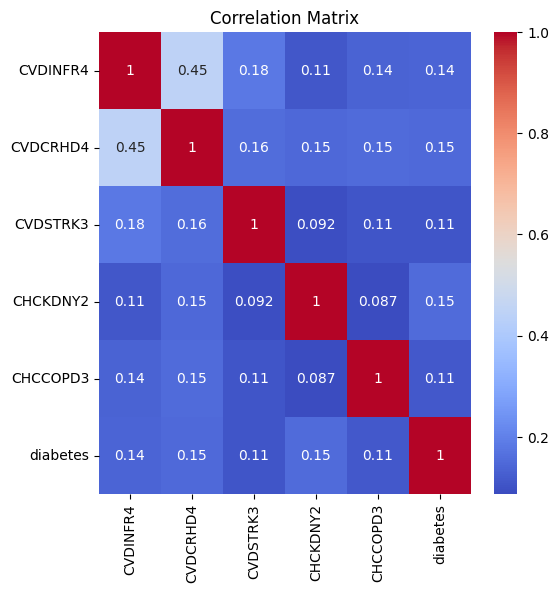

In [20]:
chronic_diseases = ['CVDINFR4', 'CVDCRHD4', 'CVDSTRK3', 'CHCKDNY2', 'CHCCOPD3']
helpers.plot_columnar_correlation(df, chronic_diseases + ['diabetes'], (6,6))

In [21]:
df['chronic_disease'] = sum([df[c] for c in chronic_diseases])
df = df.drop(chronic_diseases, axis=1)

## Convert categorical values to categorical type

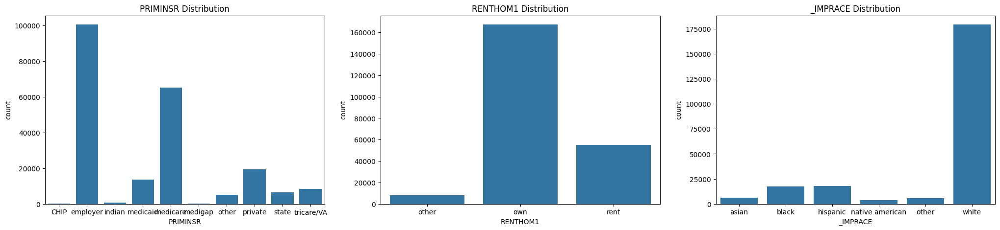

In [22]:
categorical = {
    'PRIMINSR': {1: 'employer', 2: 'private', 3: 'medicare', 4: 'medigap', 5: 'medicaid', 6: 'CHIP', 7: 'tricare/VA', 8: 'indian', 9: 'state', 10: 'other', 88: 'none' },
    'RENTHOM1': {1: 'own', 2:'rent', 3: 'other' },
    '_IMPRACE': {1: 'white', 2: 'black', 3: 'asian', 4: 'native american', 5: 'hispanic', 6: 'other'},
}

fig, axes = helpers.grid_display(3, len(categorical))
for idx, (c, mapping) in enumerate(categorical.items()):
    df[c] = df[c].map(mapping).astype('category')
    sns.countplot(x=df[c], ax=axes[idx])
    axes[idx].set_title(f'{c} Distribution')

 - PRIMINSR Distribution: This variable to represent primary insurance types.
    - The most common category is "employer", suggesting a large portion of the population has employer-provided insurance.
    - "Medicare" is the second most frequent category, indicating a significant elderly or disabled population.
    - Other notable categories include "private", "other", and "CHIP" (Children's Health Insurance Program).
    - Less common categories are "state", "Indian Health Service", and "tricare/VA" (military-related insurance).
    - The distribution shows a diverse range of insurance types, with employer-based insurance dominating.
 - RENTHOM1 Distribution: This variable represents housing status.
    - "Own" is the most prevalent category by a large margin, indicating that the majority of the population owns their homes.
    - "Rent" is the second most common category, but significantly less frequent than ownership.
    - There's a small "other" category, which might include situations like living with family, in dormitories, or other non-standard arrangements.
    - This distribution suggests a population with relatively high home ownership rates.
 - IMPRACE Distribution: This variable represents racial/ethnic categories.
    - "White" is the most prevalent category, comprising a large majority of the population.
    - "Hispanic" and "black" are the next most common categories, with similar frequencies to each other.
    - "Asian" follows as the fourth most common category.
    - "Other" and "native american" are the least common categories.
    - This distribution indicates a predominantly white population, with significant Hispanic and Black minorities, reflecting a typical US demographic profile.

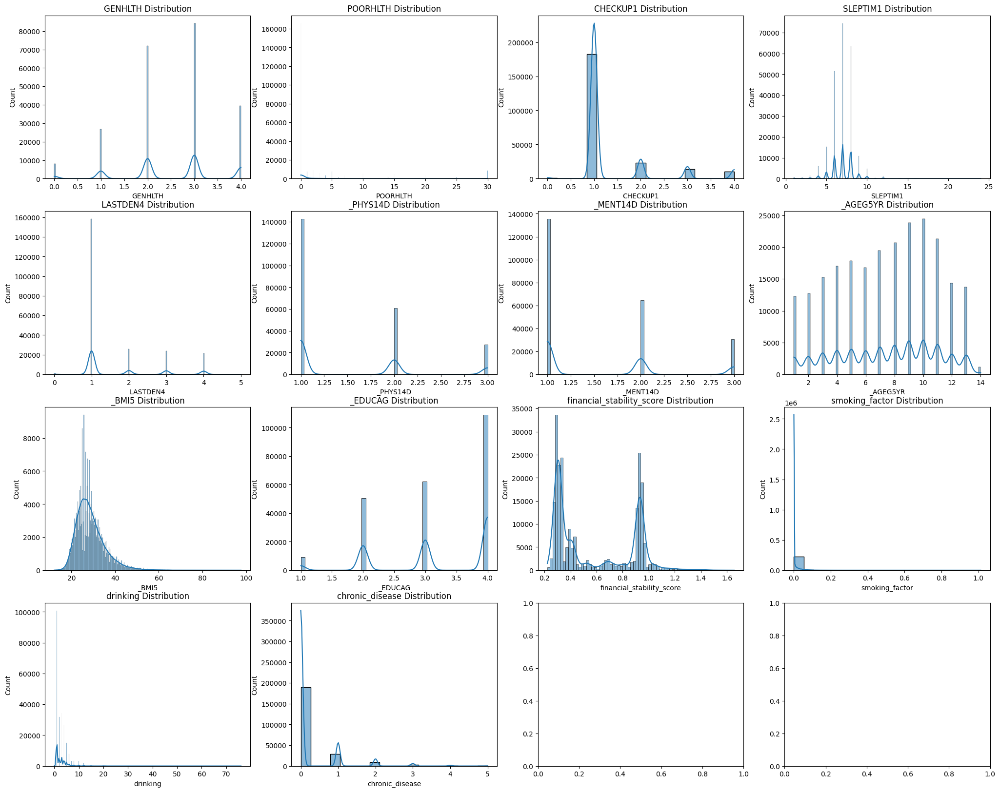

In [23]:
ordinal = {
    'GENHLTH': None,
    'POORHLTH': {88: 0},
    'CHECKUP1': {8: 0},
    'SLEPTIM1': None,
    'LASTDEN4': {8: 0},
    '_PHYS14D': None,
    '_MENT14D': None,
    '_AGEG5YR': None,
    '_BMI5': None,
    '_EDUCAG': None,
    'financial_stability_score': None,
    'smoking_factor': None,
    'drinking': None,
    'chronic_disease': None
}

fig, axes = helpers.grid_display(4, len(ordinal))
for idx, (c, mapping) in enumerate(ordinal.items()):
    if mapping is not None:
        df[c] = df[c].replace(mapping)
        
    sns.histplot(df[c], kde=True, ax=axes[idx])
    axes[idx].set_title(f'{c} Distribution')
    

- GENHLTH (General Health):
  Five distinct levels, representing categories from poor to excellent health. The most common responses are in the middle categories (levels 2 and 3), suggesting most respondents report average health.
  
- POORHLTH (Poor Health Days):
  Ranges from 0 to 30, representing days of poor health in a month. The distribution is heavily skewed towards 0, indicating most people report few or no days of poor health.

  
- CHECKUP1 (Time Since Last Checkup):
  Four levels, Most respondents fall into the first category, suggesting recent checkups are common.

  
- SLEPTIM1 (Sleep Time):
  Represents hours of sleep, with most responses clustered around 7-8 hours.

  
- LASTDEN4 (Last Dental Visit):
  Four main levels, likely representing time ranges since last dental visit. The highest frequency at level 1 suggests most respondents had recent dental visits.
  
- MAXDRNKS (Maximum Drinks):
  Represents the maximum number of drinks consumed on a single occasion. Heavily skewed towards lower numbers, with a long tail for higher consumption.

  
- PHYS14D (Physical Health):
  Represents days of poor physical health in the past 14 days. Most respondents report low numbers, with peaks at 0, 1, and 2 days.

  
- MENT14D (Mental Health):
  Similar to PHYS14D, but for mental health. The distribution suggests most people report few days of poor mental health.

  
- AGEG5YR (Age Groups):
  Represents 5-year age groupings. The distribution shows the age structure of the sample population.

  
- BMI5 (Body Mass Index):
  Categorized BMI values. The distribution suggests a significant portion of the population falls into overweight or obese categories.

  
- EDUCAG (Education Level):
  Four distinct levels of education. The peak at level 4 suggests a large portion of respondents have higher levels of education.

  
- DRNKWK2 (Drinks per Week):
  Represents the number of alcoholic drinks consumed per week. Heavily skewed towards lower numbers.

  
- HTM4 (Height):
  Represents height in discrete units (centimeters). The distribution appears normal, as expected for height.

  
- WTKG3 (Weight):
  Represents weight in discrete units (kilograms). Shows a roughly normal distribution with a slight right skew.


- The engineered feature financial_stability_score is bimodal, and suggests that most people are either financially insecure, or financially secure, with far fewer in between

- The engineered feature smoking_factor 


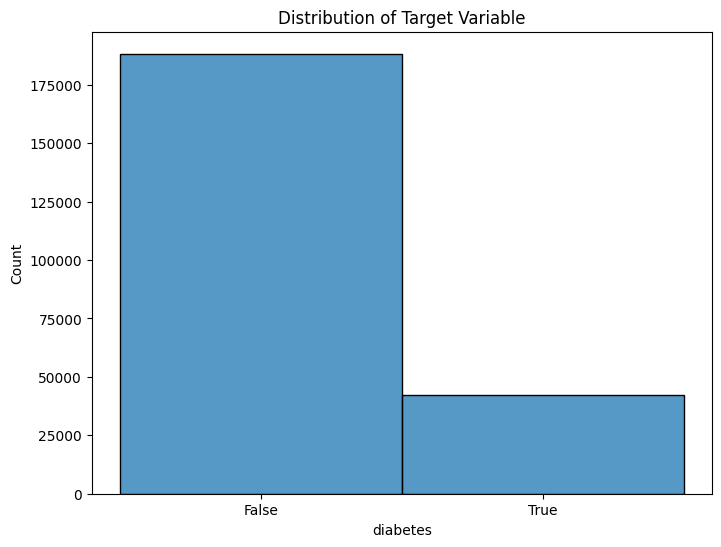

In [24]:
# Plot distribution of target variable, and determine class imbalance
c = 'diabetes'
plt.figure(figsize=(8, 6))
sns.histplot(data=df[c], discrete=True)
plt.xticks([0, 1], ['False', 'True'])
plt.title('Distribution of Target Variable')
plt.show()

This graph displays the distribution of a target variable called "diabetes", which is a binary (boolean) variable with two categories: "False" and "True".

## Key observations:

- Imbalanced distribution: There's a clear imbalance between the classes
- Majority class: The "False" (not having diabetes) category has a much higher count, approximately 190,000 instances.
- Minority class: The "True" (having diabetes or risk of diabetes) category has a lower count, about 45,000 instances.
- Ratio: The ratio of False to True is roughly 4:1, meaning for every person with diabetes, there are about 4 people without diabetes in this dataset.

## Analysis:

- Class imbalance: This distribution shows a significant class imbalance, which is common in medical datasets, especially for conditions that aren't extremely prevalent in the general population.
- Prevalence: The data suggests that about 19-20% of the individuals in this dataset have diabetes. This is higher than the general population prevalence (which is typically around 10-15% in most countries), indicating this might be a dataset from a higher-risk population or a population with more comprehensive screening.
- Modeling considerations: 
   - The class imbalance will need to be addressed in any predictive modeling. Techniques like oversampling, undersampling, using class weights, etc will be necessary.
   - Evaluation metrics should be chosen carefully. Accuracy alone would not be a good metric due to the imbalance. Metrics like precision, recall, F1-score, or AUC-ROC will be more appropriate.


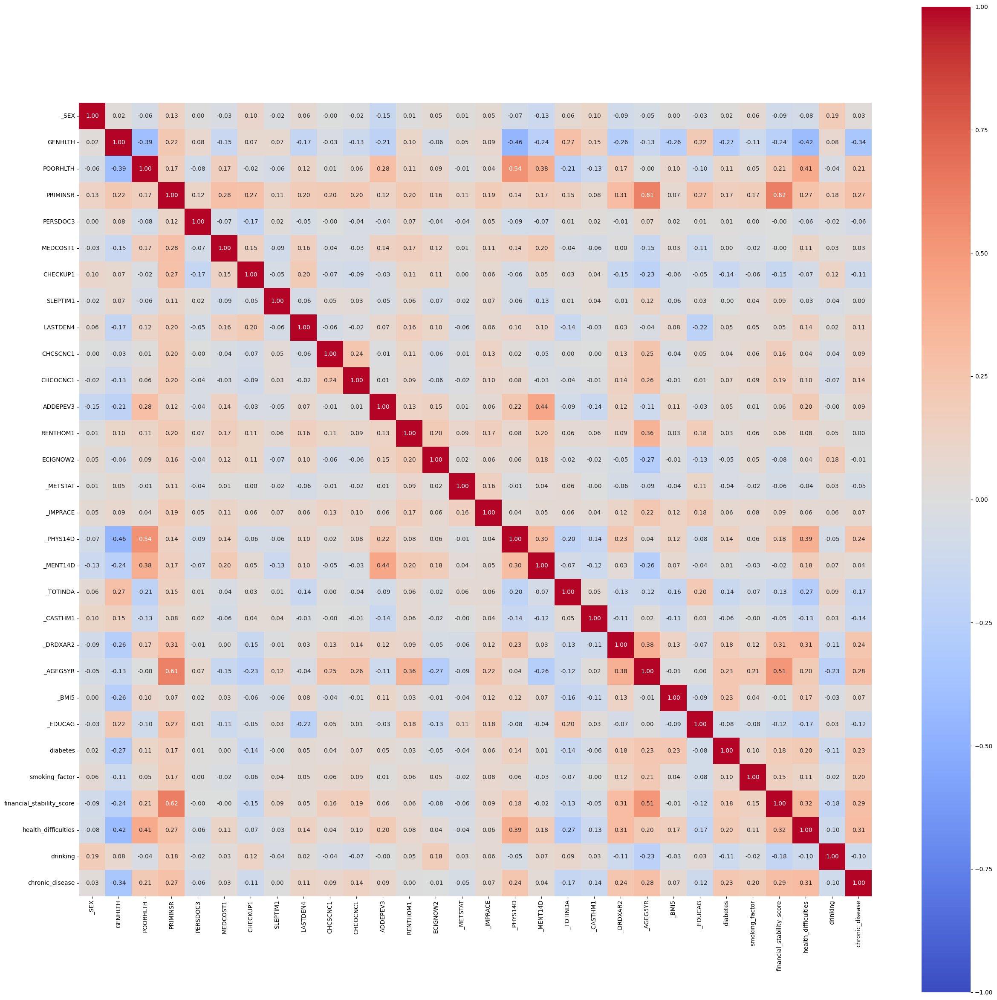

In [25]:
correlation_matrix = nominal.associations(df, nominal_columns='auto', plot=True, figsize=image_size, cmap='coolwarm')

<Figure size 3000x3000 with 0 Axes>

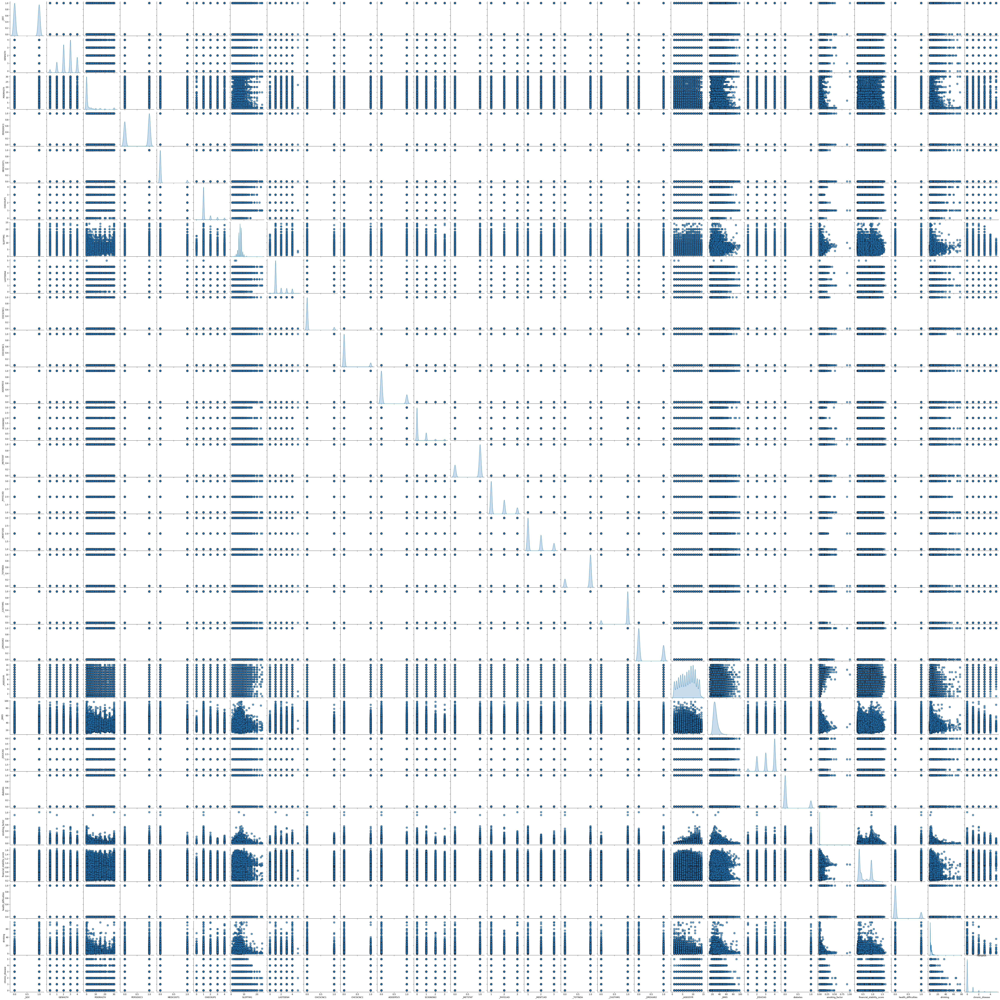

In [26]:
plt.figure(figsize=image_size)
sns.pairplot(df, diag_kind="kde", plot_kws={'alpha':0.7, 's':80, 'edgecolor':'k'})
plt.title('Pairplot')
plt.show()

## Observations

Some key features that stand out as highly correlated are

- BMI5
- GENHLTH
- PHYS14D + _TOTINDA
- smoking_factor (engineered feature)
- drinking (engineered feature)
- financial_stability_score (engineered feature)
- health_difficulties (engineered feature)
- chronic_disease (engineered feature)

As we proceed with feature selection, I expect these will likely remain important.

Some unexpected correlations that I'm interested to see if they remain after balancing and sampling:
- DRDXAR2: Arthritis. This may be correlated due to arthritis contributing to a lack of mobility, resulting in less physical activity
- Chronic disease: This feature is a composition of the chronic diseases COPD, cardio/pulminary disease, stroke, etc. This may just be linked as part of "poor health" in general

# Feature selection

We have a significant class imbalance on our target variable. We also have class imbalances for several features. To address both, I'm going to use SMOTE (oversampling) for the target, and then use a balanced binary tree for feature selection

In [27]:
# We'll dummy encode categorical values, but leave the rest as ordinal. 

categorical_columns = ['PRIMINSR', 'RENTHOM1', '_IMPRACE']
preprocessor = ColumnTransformer(
    transformers=[('cat', OneHotEncoder(drop='first', sparse_output=False), categorical_columns)], 
    remainder='passthrough',
    verbose_feature_names_out=False
)

# fdf will be our feature dataframe
fdf = pd.DataFrame(preprocessor.fit_transform(df), columns=preprocessor.get_feature_names_out(), index=df.index)

In [28]:
fdf.columns

Index(['PRIMINSR_employer', 'PRIMINSR_indian', 'PRIMINSR_medicaid',
       'PRIMINSR_medicare', 'PRIMINSR_medigap', 'PRIMINSR_other',
       'PRIMINSR_private', 'PRIMINSR_state', 'PRIMINSR_tricare/VA',
       'PRIMINSR_nan', 'RENTHOM1_own', 'RENTHOM1_rent', '_IMPRACE_black',
       '_IMPRACE_hispanic', '_IMPRACE_native american', '_IMPRACE_other',
       '_IMPRACE_white', '_SEX', 'GENHLTH', 'POORHLTH', 'PERSDOC3', 'MEDCOST1',
       'CHECKUP1', 'SLEPTIM1', 'LASTDEN4', 'CHCSCNC1', 'CHCOCNC1', 'ADDEPEV3',
       'ECIGNOW2', '_METSTAT', '_PHYS14D', '_MENT14D', '_TOTINDA', '_CASTHM1',
       '_DRDXAR2', '_AGEG5YR', '_BMI5', '_EDUCAG', 'diabetes',
       'smoking_factor', 'financial_stability_score', 'health_difficulties',
       'drinking', 'chronic_disease'],
      dtype='object')

In [29]:
label_encoder = LabelEncoder()

y = fdf['diabetes'].astype(bool).astype('category')
y_encoded = label_encoder.fit_transform(y)
X = fdf.drop('diabetes', axis=1, inplace=False)


X_train_full, X_test_full, y_train_full, y_test_full = train_test_split(X, y_encoded, test_size=0.2, random_state=random_state)

# Using SMOTE to oversample our target variable in our training set
smote = SMOTE(random_state=random_state)
X_train, y_train = smote.fit_resample(X_train_full, y_train_full)

In [30]:
y_train

array([1, 0, 1, ..., 1, 1, 1])

In [31]:
# Use BalancedRandomForestClassifier for feature selection
brf = BalancedRandomForestClassifier(n_estimators=100, random_state=random_state, bootstrap=True, sampling_strategy='all', replacement=True)
brf.fit(X_train, y_train)

# Get feature importances
importances = pd.DataFrame({'feature': X.columns, 'importance': brf.feature_importances_})
importances = importances.sort_values('importance', ascending=False)

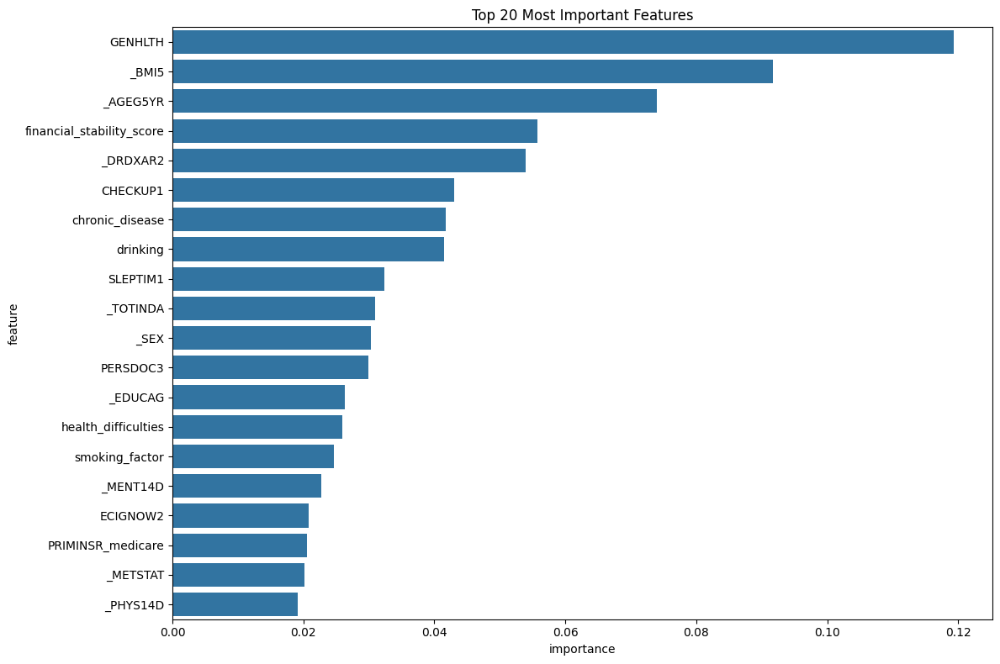

In [32]:
plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=importances.head(20))
plt.title('Top 20 Most Important Features')
plt.tight_layout()
plt.show()


In [33]:
importance_threshold = 0.01
selected_features = importances[importances['importance'] > importance_threshold]['feature'].tolist()[:15]

print(f"\nSelected {len(selected_features)} features based on importance > {importance_threshold}:")
print(selected_features)

X_selected = X[selected_features]


Selected 15 features based on importance > 0.01:
['GENHLTH', '_BMI5', '_AGEG5YR', 'financial_stability_score', '_DRDXAR2', 'CHECKUP1', 'chronic_disease', 'drinking', 'SLEPTIM1', '_TOTINDA', '_SEX', 'PERSDOC3', '_EDUCAG', 'health_difficulties', 'smoking_factor']


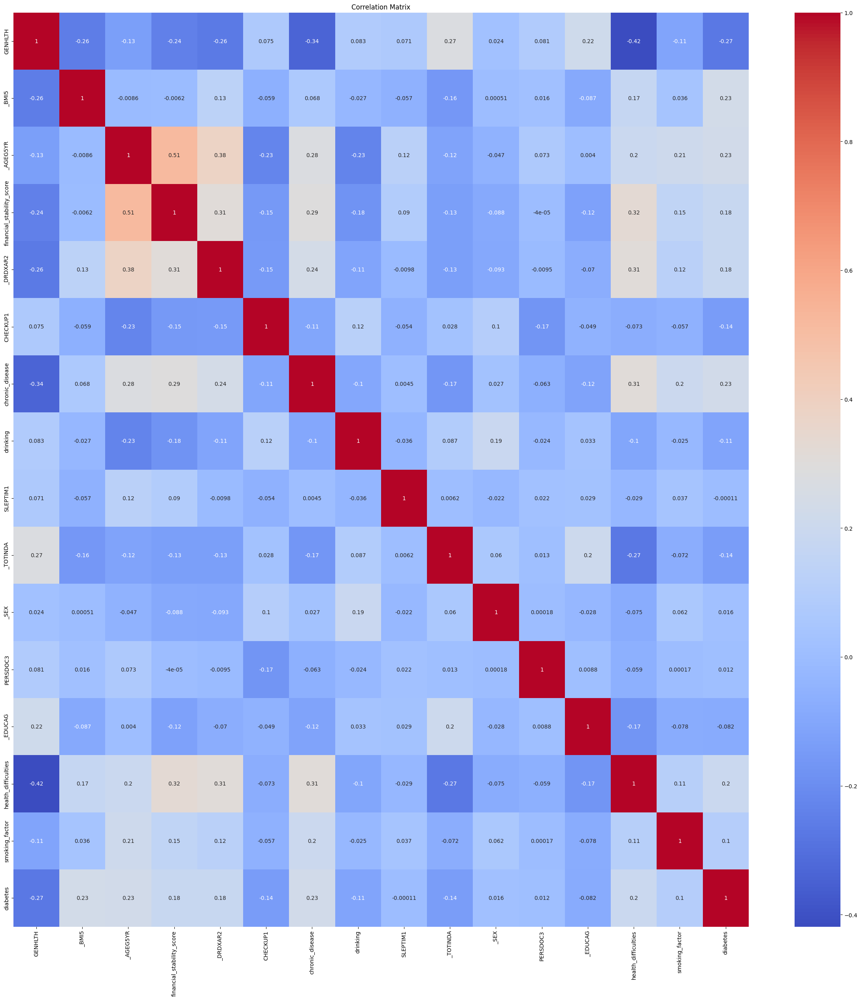

In [34]:
helpers.plot_columnar_correlation(df, selected_features + ['diabetes'], image_size)

## Analysis
- Top Predictors for Diabetes:
   - GENHLTH (general health) is the most important feature according to the importance plot and has a moderate negative correlation (-0.27) with diabetes. This suggests that poorer general health is associated with higher diabetes risk.
   - _BMI5 (BMI) is the second most important feature, With a close second in magnitude positive correlation of 0.23, This highlights the importance of BMI in diabetes prediction, despite its weak linear correlation.
   - _AGEG5YR (age group) is the third most important feature and shows a positive correlation (0.23) with diabetes, indicating that diabetes risk increases with age.
- Lifestyle Factors:
   - Drinking and smoking_factor are both in the top 15 important features, but show weak correlations with diabetes (0.11 and 0.10 respectively). This suggests they may have non-linear relationships with diabetes risk that the random forest model captures.
   - _TOTINDA (physical activity) is moderately important and negatively correlated (-0.14) with diabetes, suggesting that more physical activity is associated with lower diabetes risk.
- Health-related Factors:
   - chronic_disease is an important feature and positively correlated (0.23) with diabetes, indicating that the presence of chronic diseases increases diabetes risk.
   - CHECKUP1 (frequency of check-ups) is an important feature but shows a weak negative correlation (-0.14) with diabetes. This might indicate that regular check-ups help in early detection or prevention.
   - SLEPTIM1 (sleep time) is among the top 10 important features but has a negligible correlation with diabetes, suggesting a possible non-linear relationship.
- Socioeconomic Factors:
   - financial_stability_score is the fourth most important feature and shows a positive correlation (0.18) with diabetes. This might reflect better access to healthcare and diagnosis among more financially stable individuals.
   - _EDUCAG (education level) is moderately important but shows a weak negative correlation (-0.082) with diabetes, suggesting a slight protective effect of higher education.
- Demographics:
   - _SEX is a moderately important feature but shows very weak correlation with diabetes, indicating that gender differences in diabetes risk might be more complex than a simple linear relationship.
- Healthcare Access:
   - PERSDOC3 (having a personal doctor) is moderately important but shows very weak correlation with diabetes. This might reflect the importance of regular healthcare in diabetes management or diagnosis.
- Other Health Indicators:
   - _DRDXAR2 (arthritis diagnosis) is quite important, suggesting a potential connection between arthritis and diabetes risk.
   - health_difficulties is moderately important and positively correlated (0.20) with diabetes, indicating that overall health problems are associated with increased diabetes risk.

## Key Insights for Diabetes Prediction:
1. General health status, BMI, and age are the strongest predictors of diabetes risk.
2. Lifestyle factors (drinking, smoking, physical activity) are important but have complex relationships with diabetes risk.
3. The presence of other chronic diseases and health difficulties significantly increases diabetes risk.
4. Socioeconomic factors play a role, but their relationship with diabetes risk is not straightforward and may be influenced by factors like healthcare access.
5. Sleep patterns and regular health check-ups are important factors to consider in diabetes risk assessment.
6. Some important predictors don't show strong linear correlations, emphasizing the value of using methods that can capture non-linear relationships in diabetes prediction models.

### Feature evaluation and statistical tests

The visualizations presented include a series of boxplots, bar plots, and density plots, for each selected feature corresponding to their relationship to diabetes. The accompanying statistical test results (T-tests, Chi-square tests, and logistic regression coefficients) provide a quantitative assessment of the significance of these features.


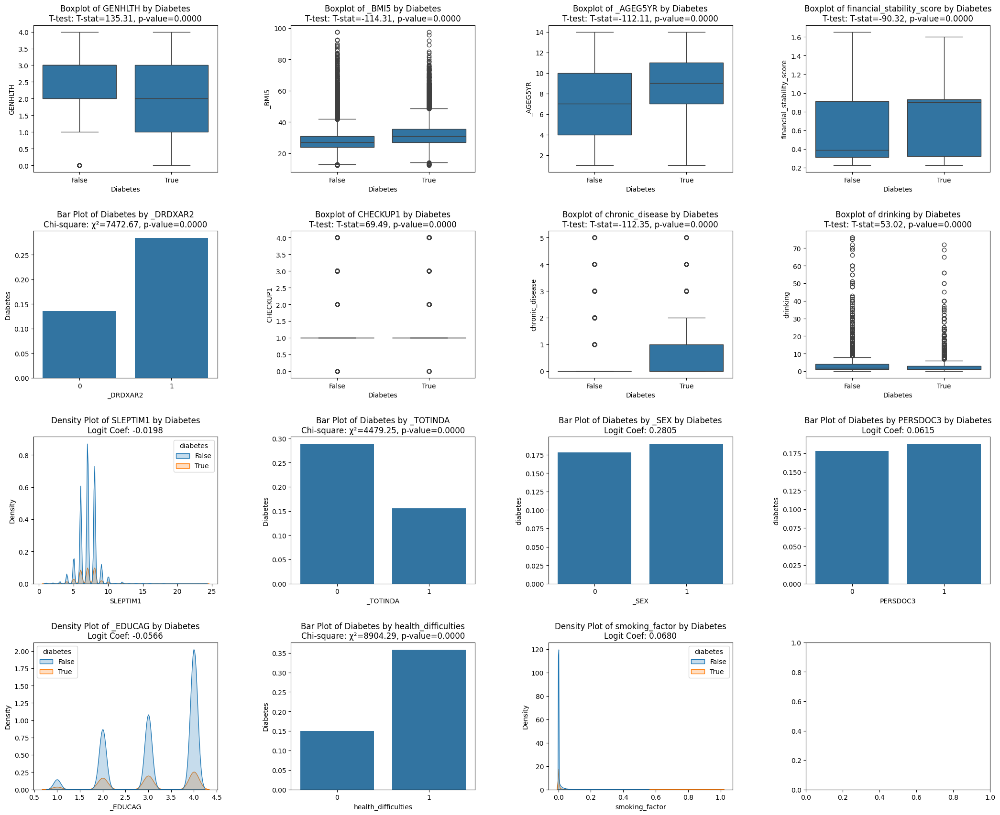

In [35]:
seemingly_non_linear = ['SLEPTIM1', '_SEX', 'PERSDOC3', '_EDUCAG', 'smoking_factor']


X = df[selected_features]
y = df['diabetes']
logit_model = LogisticRegression(max_iter=10000)
logit_model.fit(X, y)
logit_coefs = logit_model.coef_[0]

fig, axes = helpers.grid_display(4, len(selected_features))
for idx, feature in enumerate(selected_features):
    if feature in seemingly_non_linear:
        # KDE plot or scatter plot for non-linear features
        if feature in boolean_columns:
            coef = logit_coefs[selected_features.index(feature)]
            title = f'Bar Plot of Diabetes by {feature} by Diabetes\nLogit Coef: {coef:.4f}'
            sns.barplot(x=feature, y='diabetes', data=df, errorbar=None, ax=axes[idx])
            axes[idx].set_title(title)
        else:
            coef = logit_coefs[selected_features.index(feature)]
            title = f'Density Plot of {feature} by Diabetes\nLogit Coef: {coef:.4f}'
            sns.kdeplot(data=df, x=feature, hue='diabetes', fill=True, ax=axes[idx])
            axes[idx].set_title(title)
    elif feature in ordinal:
        group1 = df[df['diabetes'] == 0][feature].astype(float)
        group2 = df[df['diabetes'] == 1][feature].astype(float)
        t_stat, p_val = stats.ttest_ind(group1, group2)
        title = f'Boxplot of {feature} by Diabetes\nT-test: T-stat={t_stat:.2f}, p-value={p_val:.4f}'
        
        # Boxplot for ordinal features
        sns.boxplot(x='diabetes', y=feature, data=df, ax=axes[idx])
        axes[idx].set_title(title)
        axes[idx].set_ylabel(f'{feature}')
        axes[idx].set_xlabel('Diabetes')
    
    elif feature in boolean_columns:
        contingency_table = pd.crosstab(df[feature], df['diabetes'])
        chi2, p_val, _, _ = stats.chi2_contingency(contingency_table)
        title = f'Bar Plot of Diabetes by {feature}\nChi-square: χ²={chi2:.2f}, p-value={p_val:.4f}'
        
        # Bar plot for boolean features
        sns.barplot(x=feature, y='diabetes', data=df, errorbar=None, ax=axes[idx])
        axes[idx].set_title(title)
        axes[idx].set_ylabel('Diabetes')
        axes[idx].set_xlabel(f'{feature}')
    else:
        # Fallback option (use boxplot for ordinal, or generic for others)
        sns.boxplot(x='diabetes', y=feature, data=df, ax=axes[idx])
        axes[idx].title(f'Boxplot of {feature} by Diabetes')

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.4)
plt.show()

In [36]:
# Output for modeling notebook
df[selected_features + ['diabetes']].to_feather('selected_features_df.feather')
fdf[selected_features + ['diabetes']].to_feather('selected_features_fdf.feather')

### Analysis

- **Boxplots with T-Tests (Ordinal Features)**:
    - **GENHLTH**: The boxplot shows a noticeable difference in general health (GENHLTH) scores between individuals with and without diabetes. The T-test yields a T-statistic of 135.31 and a p-value of 0.0000, indicating a highly significant difference. This suggests that general health status is a strong discriminator for diabetes.
    - **_BMI5**: A clear distinction in BMI is evident between the two groups, with a T-statistic of 114.31 and a p-value of 0.0000. This indicates that higher BMI values are associated with diabetes, making BMI an important feature.
    - **_AGEG5YR**: Age groups (_AGEG5YR) also show a significant difference, with older age groups more likely to have diabetes. The T-statistic is 112.11, with a p-value of 0.0000.
    - **financial_stability_score**: This score, which likely reflects socioeconomic status, shows significant differences between the two groups (T-statistic = 90.72, p-value = 0.0000), indicating that financial stability is associated with diabetes prevalence.
    - **CHECKUP1**: The boxplot for regular checkups (CHECKUP1) shows significant variation (T-statistic = 69.49, p-value = 0.0000), suggesting that frequency of medical checkups is a significant factor.
    - **chronic_disease**: As expected, individuals with chronic diseases show higher rates of diabetes (T-statistic = 112.35, p-value = 0.0000). This confirms the role of chronic diseases as risk factors.
    - **drinking**: The amount of drinking shows a significant difference between the two groups (T-statistic = 53.02, p-value = 0.0000), although the impact seems less pronounced compared to other factors.
- **Bar Plots with Chi-Square Tests (Boolean Features)**:
    - **_DRDXAR2**: Arthritis shows a strong association with diabetes (Chi-square = 7472.67, p-value = 0.0000), indicating a significant relationship.
    - **_TOTINDA**: Total inactive days is significantly associated with diabetes (Chi-square = 4479.25, p-value = 0.0000). Inactivity is known to be a risk factor for diabetes.
    - **_SEX**: Gender (_SEX) shows a moderate association with diabetes, with a logistic coefficient of 0.2805. While statistically significant, the impact is smaller compared to other features.
    - **PERSDOC3**: Having a personal doctor (PERSDOC3) has a low logistic coefficient (0.0015), suggesting it’s not a strong predictor of diabetes, despite being statistically significant.
    - **health_difficulties**: The presence of health difficulties is highly associated with diabetes (Chi-square = 9904.29, p-value = 0.0000), confirming its relevance as a feature.
-  **Density Plots with Logistic Coefficients (Seemingly Non-Linear Features)**:
    - **SLEPTIM1**: Sleep time (SLEPTIM1) shows a minor negative association with diabetes (Logit Coef: -0.0198). The density plot indicates a slight difference in distributions, but the impact on diabetes prediction is small.
    - **_EDUCAG**: Education level (_EDUCAG) has a moderate association with diabetes (Logit Coef: 0.0566), with higher education levels showing lower diabetes prevalence. The density plot shows some overlap but indicates that education is a relevant feature.
    - **smoking_factor**: Smoking factor has a small positive association with diabetes (Logit Coef: 0.0680). The density plot shows that smoking is more prevalent among those with diabetes, albeit with a subtle impact.


# Summary

1. **Feature Engineering**: 
   - Created a composite smoking factor to capture the cumulative impact of smoking behavior.
   - Developed a financial stability score combining various socioeconomic indicators.
   - Engineered a health difficulties feature from correlated disability indicators.
   - Engineered a chronic disease feature, which combined chronic disease indicators into a single feature.

2. **Target Variable Distribution**:
   - Significant class imbalance observed: approximately 80% non-diabetic vs. 20% diabetic.
   - This imbalance necessitates careful consideration in modeling approaches.

3. **Feature Selection and Importance**:
   - Top predictors identified: General Health (GENHLTH), BMI (_BMI5), Age (_AGEG5YR), Financial Stability Score.
   - Other important features: Arthritis (_DRDXAR2), Checkup Frequency (CHECKUP1), Chronic Disease, Drinking, Sleep Time (SLEPTIM1), Physical Activity (_TOTINDA).

4. **Key Relationships**:
   - Strong positive correlations with diabetes: BMI, age, chronic diseases, health difficulties.
   - Negative correlations: general health status, physical activity.
   - Complex relationships: financial stability (positive correlation, possibly due to healthcare access), education level (weak negative correlation).

5. **Statistical Tests**:
   - T-tests confirmed significant differences between diabetic and non-diabetic groups for continuous variables like BMI, age, and general health.
   - Chi-square tests showed significant associations between categorical variables (e.g., arthritis, physical activity) and diabetes status.
   - Logistic regression coefficients provided insights into the direction and strength of relationships for seemingly non-linear features.

## Analytical Conclusions

- **Multifaceted Nature of Diabetes Risk**: 
  Diabetes risk is influenced by a complex interplay of health, lifestyle, demographic, and socioeconomic factors. This underscores the need for a holistic approach to diabetes prediction and prevention.
- **Importance of Non-linear Relationships**: 
   Several key predictors (e.g., sleep time, smoking factor) show non-linear relationships with diabetes risk. This suggests that advanced modeling techniques capable of capturing non-linear patterns may be beneficial.
- **Socioeconomic Factors**: 
   The significance of the financial stability score highlights the role of socioeconomic factors in diabetes risk, possibly through their impact on healthcare access and lifestyle choices.
- **Lifestyle Factors**: 
   The importance of BMI, physical activity, drinking, and smoking in the predictive model emphasizes the critical role of lifestyle factors in diabetes risk.
- **Chronic Health Conditions**: 
   The strong association between other chronic conditions (especially arthritis) and diabetes suggests the importance of considering overall health status in diabetes risk assessment.
- **Age and Gender**: 
   While age is a strong predictor, gender shows a more complex relationship, indicating the need for nuanced interpretation of demographic factors.

## Implications for Modeling

- **Class Imbalance**: 
   SMOTE and class weighting will be employed to address the significant class imbalance in the target variable and impalanced features
- **Feature Selection**: 
   The identified important features should form the core of the predictive model, though there will likely be further refinement during the modeling phase.
- **Non-linear Modeling**: 
   I will be choosing algorithms that are capable of capturing non-linear relationships, specicially Gradient Boosting Machines (XGBoost)
- **Interpretability**: 
   Given the complex relationships observed, interpretability will be important.
- **Validation Strategy**: 
   Robust cross-validation will be important as well.
- **Metric Selection**: 
   Metrics other than just raw accuracy (e.g., AUC-ROC, F1-score) will be used to evaluate model performance because of the target considering the class imbalance.


# Conclusion

## Feature Selection

1. GENHLTH (General Health)
2. _BMI5 (Body Mass Index)
3. _AGEG5YR (Age Group)
4. financial_stability_score (Engineered feature)
5. _DRDXAR2 (Arthritis diagnosis)
6. CHECKUP1 (Frequency of check-ups)
7. chronic_disease (Engineered feature)
8. drinking (Engineered feature)
9. SLEPTIM1 (Sleep time)
10. _TOTINDA (Physical activity)
11. _SEX (Gender)
12. PERSDOC3 (Having a personal doctor)
13. _EDUCAG (Education level)
14. health_difficulties (Engineered feature)
15. smoking_factor (Engineered feature)

Rationale:
- These features showed the highest importance in our random forest feature selection.
- They represent a mix of health status indicators, lifestyle factors, demographic information, and socioeconomic factors, providing a holistic view of diabetes risk.
- The engineered features (financial_stability_score, chronic_disease, drinking, health_difficulties, smoking_factor) capture complex relationships and should be retained.

## Modeling Approaches

1. Gradient Boosting Machines (e.g., XGBoost)
   - Rationale: Can capture non-linear relationships and interactions between features, which we observed in several key predictors (e.g., BMI, age, sleep time).
   - Handles mixed data types well (categorical and numerical).
   - Built-in feature importance metrics for interpretability.

2. Balanced Random Forest
   - Rationale: Performed well in our initial feature selection, suggesting it may be able to capture the complex relationships in our data.
   - Robust to outliers and can handle non-linear relationships.
   - Provides feature importance metrics.

## Handling Class Imbalance

Given the significant class imbalance (80% non-diabetic vs. 20% diabetic), I will employ

1. SMOTE (Synthetic Minority Over-sampling Technique) for oversampling the minority class.
3. Possibly using scale_pos_weight in XGBoost to further adjust class weights

## Evaluation Metrics

Due to the class imbalance, I'll be relying more on the following metrics

1. Area Under the ROC Curve (AUC-ROC)
2. F1-Score
3. Precision-Recall Curve
4. Balanced Accuracy